# Capstone Project : Yelp's Customized Recommender (Part 4) - Exploratory Data Analysis & Data Preparation for Modelling

**Prepared by:** Daniel Han<br>
**Prepared for:** Brainstation

### 5.3 Exploratory Data Analysis (EDA) & Preparation for Modelling

An exploratory data analysis is conducted with the cleaned dataset to draw key insights.

In [1]:
# Import libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Show all columns
pd.set_option('display.max_columns', None)

In [3]:
# Read in data
df = pd.read_csv('yelp_cleaned.csv', index_col = 0)

In [4]:
# Review Shape
df.shape

(6795775, 90)

First, only the rows where the business is located in California are selected.

In [5]:
# Only keep rows where business ins located in CA
df = df[df['state'] == 'CA']

The city names are revised such that they are all in lower case and multiple spaces are set to one.

In [6]:
# Lowercase city names and fix multiple spaces
df['city'] = df.city.str.lower().str.replace(r'[\s]+', ' ', regex = True)

In [7]:
# Display values
df.city.value_counts()

santa barbara       258715
goleta               44314
carpinteria          16912
isla vista            7499
montecito             4840
summerland            2339
truckee                175
cerritos               136
real goleta             46
santa barbra            41
santa maria             39
reno                    37
salinas                 29
sparks                  26
santa clara             25
mission canyon          19
santa ynez              17
santa barbara           15
tampa                   14
oxnard                  13
aliso viejo             10
costa mesa               9
port hueneme             7
los angeles              5
south lake tahoe         5
Name: city, dtype: int64

It can be seen that some typos exist. For instance, there are 41 data points where the city name is 'santa barbra'. This is likely a typo where the letter 'a' was forgotten.

In [8]:
# select rows where city name is either 'santa barbara' or 'santa barbra'
df = df[(df['city'] == 'santa barbara') | (df['city'] == 'santa barbra')]

Now that only the data points in Santa Barbara, CA have been chosen, the state and city columns are dropped.

In [9]:
df.drop(columns = ['city', 'state'], inplace = True)

In [10]:
# Review cleaned dataset
df.head(1)

,review_id,user_id,business_id,stars,text,date,user_review_count,yelping_since,userful_count,funny_count,cool_count,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,friend_count,name,latitude,longitude,business_rating,business_review_count,is_open,alcohol,bikeparking,businessacceptscreditcards,byappointmentonly,caters,goodforkids,hastv,noiselevel,outdoorseating,restaurantsattire,restaurantsdelivery,restaurantsgoodforgroups,restaurantspricerange,restaurantsreservations,restaurantstakeout,wifi,casual,classy,divey,garage,hipster,intimate,lot,romantic,street,touristy,trendy,upscale,valet,validated,active life,american (traditional),automotive,bars,beauty & spas,event planning & services,food,health & medical,home services,local services,nightlife,restaurants,sandwiches,shopping,monday_start_time,monday_end_time,tuesday_start_time,tuesday_end_time,wednesday_start_time,wednesday_end_time,thursday_start_time,thursday_end_time,friday_start_time,friday_end_time,saturday_start_time,saturday_end_time,checkin_count
8,ZKvDG2sBvHVdF5oBNUOpAQ,wSTuiTk-sKNdcFyprzZAjg,B5XSoSG3SfvQGtKEGQ1tSQ,3,This easter instead of going to Lopez Lake we ...,2016-03-30 22:46:33,24,2015-10-27 22:53:34,31,8,2,0,1,0,0,0,0,0,0,0,0,0,0,0,1,Los Padres National Forest,34.597239,-119.510772,4,13,1,Unknown,True,Unknown,Unknown,Unknown,True,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,2,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,False,Unknown,Unknown,False,Unknown,False,Unknown,Unknown,Unknown,False,False,1,0,0,0,0,0,0,0,0,0,0,0,0,0,10:00:00,19:00:00,11:00:00,21:00:00,11:00:00,21:00:00,11:00:00,21:00:00,11:00:00,20:30:00,11:00:00,21:00:00,104


In [11]:
# Review Shape of dataframe
df.shape

(258756, 88)

### 5.3.1 General Understanding of Data

#### Number of Reviews

The general number of reviews given by users is reviewed.

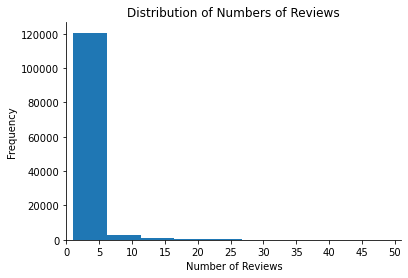

In [21]:
# Review distribution of review numbers in the dataset
df.groupby('user_id').count()['business_id'].sort_values(ascending=False).plot(kind = 'hist', bins = 60)
plt.xlim([0,51])
plt.xticks(range(0,51, 5))
sns.despine()
plt.title('Distribution of Numbers of Reviews')
plt.xlabel('Number of Reviews')
plt.show()

It can be seen that most users write no more than five reviews.

#### Categorical Data

All categorical variables are reviewed in terms of their general distributions. Binary columns and discrete columns such as business ratings and review ratings are considered categorical.

In [12]:
# Categorical columns to review

# Slice from original dataframe
df_categorical= df.loc[:,'is_open':'shopping']

# Add certain categorical columns to be included
df_categorical[['average_stars', 'stars', 'business_rating']] = df[['average_stars', 'stars', 'business_rating']]

# Display Categorical Column
df_categorical.head()

,is_open,alcohol,bikeparking,businessacceptscreditcards,byappointmentonly,caters,goodforkids,hastv,noiselevel,outdoorseating,restaurantsattire,restaurantsdelivery,restaurantsgoodforgroups,restaurantspricerange,restaurantsreservations,restaurantstakeout,wifi,casual,classy,divey,garage,hipster,intimate,lot,romantic,street,touristy,trendy,upscale,valet,validated,active life,american (traditional),automotive,bars,beauty & spas,event planning & services,food,health & medical,home services,local services,nightlife,restaurants,sandwiches,shopping,average_stars,stars,business_rating
8,1,Unknown,True,Unknown,Unknown,Unknown,True,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,2,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,False,Unknown,Unknown,False,Unknown,False,Unknown,Unknown,Unknown,False,False,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,4
9,1,beer_and_wine,True,True,Unknown,False,True,False,average,False,casual,True,True,2,False,True,no,True,True,False,False,False,False,False,False,True,Unknown,Unknown,False,False,False,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4,3,3
35,1,Unknown,True,True,Unknown,True,True,False,average,True,casual,Unknown,True,2,False,True,no,True,False,False,False,True,False,False,False,True,False,True,False,False,False,0,0,0,0,0,0,1,0,0,0,0,1,1,0,4,5,4
56,1,Unknown,True,True,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,2,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,5,4
61,1,beer_and_wine,True,True,False,False,True,False,average,True,casual,True,False,2,False,True,no,True,True,False,False,False,False,False,False,False,False,False,False,False,True,0,0,0,1,0,0,1,0,0,0,1,1,0,0,4,5,4


The distribution of the categorical variables above are plotted as below:

In [13]:
# For each categorical column, review the count distributions

# Number of columns
num_cols = 3

# Corresponding number of rows
num_rows = len(df_categorical.columns) // num_cols + 1 if len(df_categorical.columns) % num_cols != 0 else len(df_categorical.columns) // num_cols

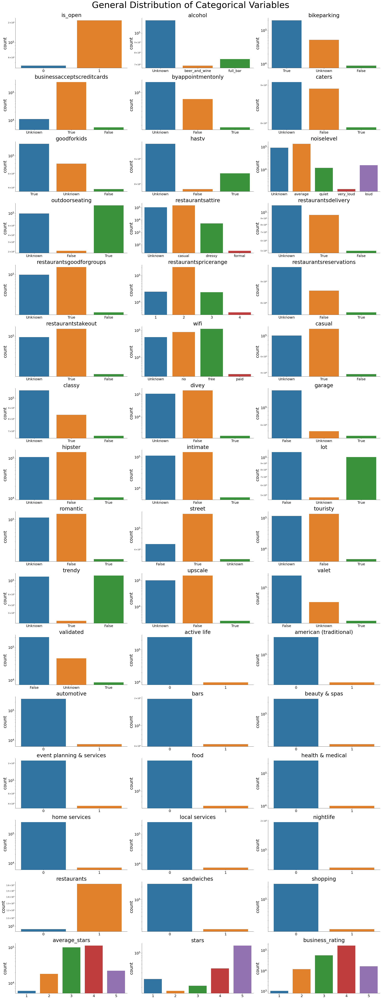

In [14]:
# Create distributions of categorical variables
plt.subplots(nrows = num_rows, ncols = num_cols, figsize = (30,80))

cols = list(df_categorical.columns)

for i, j in enumerate(cols):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.countplot(x = j, data = df_categorical, log = True)
    
    plt.title(j, size = 30)
    plt.yticks(fontsize = 20)
    plt.ylabel('count', fontsize = 25)
    plt.xticks(fontsize = 20)
    plt.xlabel('', fontsize = 25)
    sns.despine()

plt.suptitle('General Distribution of Categorical Variables\n\n', size = 50)
plt.tight_layout()
plt.show()

From the distribution above, the following observations are made:
- Most businesses have average ratings from 2 to 4
- Most businesses are still open, provide bike parking, accept creditcard, do not have parking garage or other parking options (street, valet, validated parking) but have parking lots.
- Many business attributes are unknown for most businesses - this is where improvments is required during data collection.
- The average stars given by Yelp users and business rating are approximately normally distributed.

#### Numeric Variables

As with categorical variables, numeric variables are also reviewed in terms of their general distributions. Binary columns and discrete columns such as business ratings and review ratings are considered categorical.

Before creating the numeric dataframe, new numeric column is created with the 'date' (review date) and 'yelping_since' columns to calculate how long a particular user has been "Yelping".

In [15]:
# Change 'date' and 'yelping_since' columns to datetime
df['date'] = pd.to_datetime(df.date)
df['yelping_since'] = pd.to_datetime(df.yelping_since)

In [16]:
# Import datetime library
import datetime

In [17]:
# Find how long user was yelping for
df['yelping_for'] = df['date'] - df['yelping_since']

# Convert to number of days
df['yelping_for'] = round(df['yelping_for'] / datetime.timedelta(days = 1), 2)

# Show Series
df.yelping_for

8           155.00
9             2.30
35          347.80
56         2310.74
61         1797.44
            ...   
6990077    4613.37
6990140    3271.94
6990167    4189.85
6990180    3166.49
6990250    3383.20
Name: yelping_for, Length: 258756, dtype: float64

Creating a numeric dataframe:

In [18]:
# Numeric columns to review

# Select all columns with integers and float data
df_numerical = df.select_dtypes(include = ['int', 'float'])

In [19]:
# Drop binary and discrete columns
df_numerical.drop(columns = ['is_open', 'business_rating', 'restaurantspricerange', 'average_stars', 'stars'], inplace = True)

# Drop more binary columns
cols_to_drop = df_numerical.loc[:,'active life':'shopping'].columns
df_numerical.drop(columns = cols_to_drop, inplace = True)

df_numerical.head()

,user_review_count,userful_count,funny_count,cool_count,fans,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,friend_count,latitude,longitude,business_review_count,checkin_count,yelping_for
8,24,31,8,2,0,0,0,0,0,0,0,0,0,0,0,0,1,34.597239,-119.510772,13,104,155.00
9,12,3,1,2,0,0,0,0,0,0,0,0,0,0,0,0,256,34.416984,-119.695556,488,1050,2.30
35,17,14,0,5,0,0,0,0,0,0,0,0,0,0,0,0,1,34.414445,-119.690672,389,636,347.80
56,38,32,4,9,2,0,0,1,1,0,0,2,0,0,0,0,1,34.414912,-119.694171,13,4,2310.74
61,338,800,144,353,30,24,4,0,0,0,9,27,39,39,34,5,115,34.408715,-119.685019,2404,6148,1797.44


The distribution of the numeric variables above are plotted as below:

In [20]:
# For each numeric column, review the count distributions

# Number of columns
num_cols = 3

# Corresponding Number of Rows
num_rows = len(df_numerical.columns) // num_cols + 1 if len(df_numerical.columns) % num_cols != 0 else len(df_numerical.columns) // num_cols

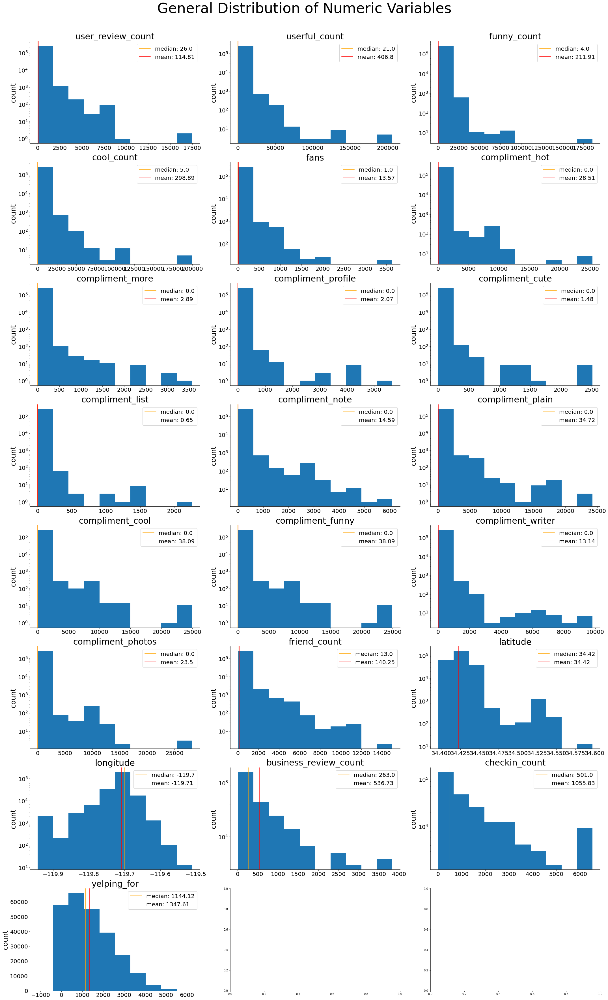

In [21]:
plt.subplots(nrows = num_rows, ncols = num_cols, figsize = (30,50))

cols = list(df_numerical.columns)

for i, j in enumerate(cols):
    plt.subplot(num_rows, num_cols, i + 1)
    if i == len(cols) - 1:
        plt.hist(x = j, data = df_numerical, log = False)
    else:
        plt.hist(x = j, data = df_numerical, log = True)
    plt.axvline(df_numerical[j].median(), label = f'median: {round(df_numerical[j].median(), 2)}', color = 'orange')
    plt.axvline(df_numerical[j].mean(), label = f'mean: {round(df_numerical[j].mean(), 2)}', color = 'red')
    
    plt.title(j, size = 30)
    plt.yticks(fontsize = 20)
    plt.ylabel('count', fontsize = 25)
    plt.xticks(fontsize = 20)
    plt.xlabel('', fontsize = 25)
    plt.legend(fontsize = 20)
    sns.despine()
    
plt.suptitle('General Distribution of Numeric Variables\n\n', size = 50)
plt.tight_layout()
plt.show()

From the distribution above, the following observations are made:
- More than half the users get less than 10 compliments on their profiles. Certain popular users have compliments on the order of $10^{4}$.
- Most businesses are still open, provide bike parking, accept creditcard, do not have parking garage or other parking options (street, valet, validated parking) but have parking lots.
- Many business attributes are unknown for most businesses - this is where improvments can be made during data collection.
- The average stars given by Yelp users are approximately normally distributed.

### 5.3.2 Text Data Preprocessing for Calibration of User Rating

The issue with having discrete user ratings from 1 to 5 is that, when multiple businesses are predicted to have 5-star ratings for a certain reviewer, it is impossible for the recommender to sort such businesses in the order of rating.

For this reason, the review texts are tokenized on which the sentiment is computed. The sentiment is then converted to a continuous rating between 0 and 5 and are combined with the provided target variable `star` to create a new `adjusted_rating` column.

#### Text Tokenization

This subsection demonstrates the process of text tokenization. First, using the `gensim` library, every user review is tokenized. Then, common stopwords such as 'on' or 'where', which do not contribute to the sentiment of a text are removed from the reviews. Finally, any differents forms of the same word (i.e., 'work', 'working' and 'works') are lemmatized to their root form.

The above three steps of operation are combined to a single function `custom_tokenizer`.

In [22]:
# The following code is only required if nltk packages are not already installed.
# import nltk
# nltk.download()

In [23]:
# Import Gensim
import gensim

In [24]:
# Import libraries
from nltk.corpus import stopwords
# from nltk.stem import WordNetLemmatizer 
import spacy

In [25]:
# Loading stopwords from spacy
stopwords_spacy=spacy.load("en_core_web_sm").Defaults.stop_words

# Loading stopwords from NLTK
stopwords_nltk = stopwords.words('english')

# combining the stopword list
combined_stopwords = set((set(stopwords_spacy)|set(stopwords_nltk)))

In [26]:
# Create Lemmatizer from SpaCy Library
lemmatizer = spacy.load('en_core_web_sm', disable = ['parser','ner'])

In [27]:
# Create a custom tokenizer
def custom_tokenizer(text: str):
    
# Step 1 - Tokenization
    
    # tokenize given string using Gensim's preprocessor
    tokenized = gensim.utils.simple_preprocess(text) # This returns a list of strings
    
# Step 2 - Stopword Removal
    
    # Create an empty list of non-stopwords
    tokenized_no_stopwords = []

    # Loop over the tokenized list of strings and add only non-stopwords to the empty list above
    for i in tokenized:
        if i not in combined_stopwords:
            tokenized_no_stopwords.append(i) # At the end of this for loop, a list of strings is returned
    
# Step 3 - Lemmatization
    
    # Create an instance of SpaCy.Token.doc.Doc using the stopword-removed list of strings
    doc = lemmatizer(' '.join(tokenized_no_stopwords))
    
    # Create a final lsist, which should contain all lemmatized, non-stopwords, without any numerical or special characters.
    final_string = [token.lemma_ for token in doc]
    
    return final_string

The `custom_tokenizer` function is applied to all the reviews in the dataset.

In [28]:
# Apply function to all elements in text column 
df['text'] = df.text.apply(custom_tokenizer)

#### Sentiment Analysis

Using the `SentimentIntensityAnalyzer` attribute from NLTK, each tokenized review is scored its sentiment. 

In [29]:
# Import NLTK Sentiment Intensity Analyzer
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [30]:
# Instantiate sentiment intensity analyzer
sid = SentimentIntensityAnalyzer()

In [31]:
# Score each text
df["score"] =df["text"].apply(lambda x: sid.polarity_scores(' '.join(x)))

In [32]:
# Display score column
df[['score']].head()

,score
8,"{'neg': 0.226, 'neu': 0.545, 'pos': 0.229, 'co..."
9,"{'neg': 0.044, 'neu': 0.531, 'pos': 0.425, 'co..."
35,"{'neg': 0.0, 'neu': 0.601, 'pos': 0.399, 'comp..."
56,"{'neg': 0.0, 'neu': 0.627, 'pos': 0.373, 'comp..."
61,"{'neg': 0.01, 'neu': 0.621, 'pos': 0.369, 'com..."


The result returns a disctionary of sentiment scores. From this dictionary, the score corresponding to the 'compound' key is selected.

In [33]:
# Select the values under 'compound' key
df["compound_score"] = df["score"].apply(lambda x: x["compound"])

# Drop the original 'score' column
df.drop("score",axis= 1,inplace=True)

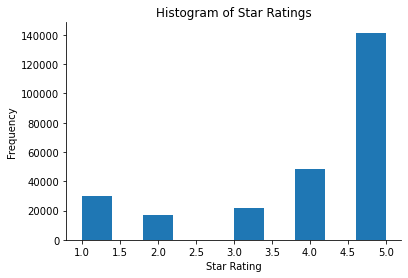

In [34]:
# Review distribution of compound score
df.stars.plot(kind = 'hist')
plt.title('Histogram of Star Ratings')
plt.xlabel('Star Rating')
sns.despine()
plt.show()

The histogram of the compound score is also reviewed.

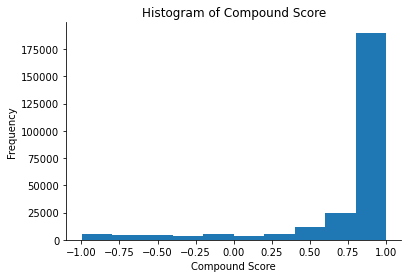

In [35]:
# Review distribution of compound score
df.compound_score.plot(kind = 'hist')
plt.title('Histogram of Compound Score')
plt.xlabel('Compound Score')
sns.despine()
plt.show()

Two observations are made:
- The compound score was distributed on a scale from -1 to 1, and
- Most reviews are highly positive.

These scores are adjusted to to be on a scale of 0 to 5. In this process, 70% of the user's star rating and 30% of the compound score computed above are combined together to create the final `adjusted_rating`. Since the primary purpose of taking the text reviews into account is to change the discrete ratings to continuous, and since the actual star rating is considered to be more representative of a user's satisfaction level with a business than the sentiment score, more weight is given to the star rating.

In [36]:
# Rescale the compound scores such that they are distributed from 0 to 5.
df['adjusted_rating'] = ((df.compound_score + 1) * 5 / 2) * 0.3 + df.stars * 0.7

Once the `adjusted_rating` has been created, the `compound_score` and `stars` columns are deleted.

In [37]:
# Drop the original compound_score column and stars columns; the adjusted_score column replaces the stars column
df.drop(columns = ['compound_score', 'stars'], inplace = True)

# Remove from categorical df as well
df_categorical.drop(columns = 'stars', inplace = True)

In [38]:
# Display adjusted rating
df.head(1)

,review_id,user_id,business_id,text,date,user_review_count,yelping_since,userful_count,funny_count,cool_count,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,friend_count,name,latitude,longitude,business_rating,business_review_count,is_open,alcohol,bikeparking,businessacceptscreditcards,byappointmentonly,caters,goodforkids,hastv,noiselevel,outdoorseating,restaurantsattire,restaurantsdelivery,restaurantsgoodforgroups,restaurantspricerange,restaurantsreservations,restaurantstakeout,wifi,casual,classy,divey,garage,hipster,intimate,lot,romantic,street,touristy,trendy,upscale,valet,validated,active life,american (traditional),automotive,bars,beauty & spas,event planning & services,food,health & medical,home services,local services,nightlife,restaurants,sandwiches,shopping,monday_start_time,monday_end_time,tuesday_start_time,tuesday_end_time,wednesday_start_time,wednesday_end_time,thursday_start_time,thursday_end_time,friday_start_time,friday_end_time,saturday_start_time,saturday_end_time,checkin_count,yelping_for,adjusted_rating
8,ZKvDG2sBvHVdF5oBNUOpAQ,wSTuiTk-sKNdcFyprzZAjg,B5XSoSG3SfvQGtKEGQ1tSQ,"[easter, instead, go, lopez, lake, go, los, pa...",2016-03-30 22:46:33,24,2015-10-27 22:53:34,31,8,2,0,1,0,0,0,0,0,0,0,0,0,0,0,1,Los Padres National Forest,34.597239,-119.510772,4,13,1,Unknown,True,Unknown,Unknown,Unknown,True,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,2,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,False,Unknown,Unknown,False,Unknown,False,Unknown,Unknown,Unknown,False,False,1,0,0,0,0,0,0,0,0,0,0,0,0,0,10:00:00,19:00:00,11:00:00,21:00:00,11:00:00,21:00:00,11:00:00,21:00:00,11:00:00,20:30:00,11:00:00,21:00:00,104,155.0,2.8887


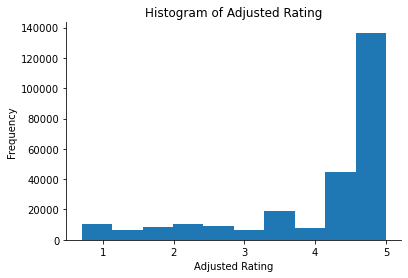

In [39]:
# Review distribution of compound score
df.adjusted_rating.plot(kind = 'hist')
plt.title('Histogram of Adjusted Rating')
plt.xlabel('Adjusted Rating')
sns.despine()
plt.show()

#### Wordcloud

The words highly associated with high and low ratings are depicted in this subsction. A rating of 3 has been determined as the threshold.

In [40]:
# Import WordCloud
from wordcloud import WordCloud
%matplotlib inline

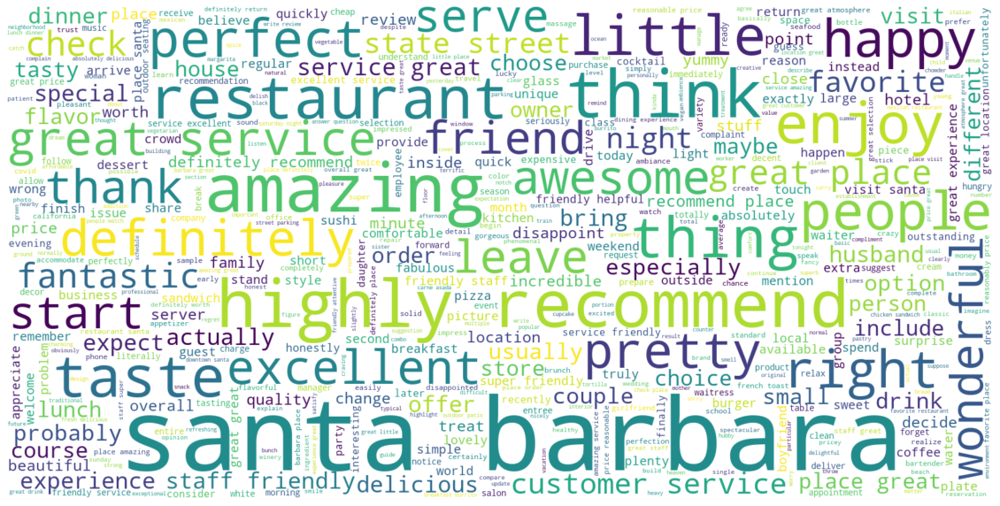

In [41]:
# Display WordCloud associated with rating >= 3
plt.figure(figsize = (20,20))
Wc = WordCloud(max_words = 500 , width = 1600 , height = 800,
               min_word_length=5,background_color='white').generate(" ".join(df[df.adjusted_rating >= 3].text.apply(lambda x : ' '.join(x))))

plt.axis("off")
plt.imshow(Wc , interpolation = 'bilinear')

Based on the above, some of the keywords associated with high ratings were found to be: 

- Pretty
- Great Service
- Staff
- Friendly
- Taste

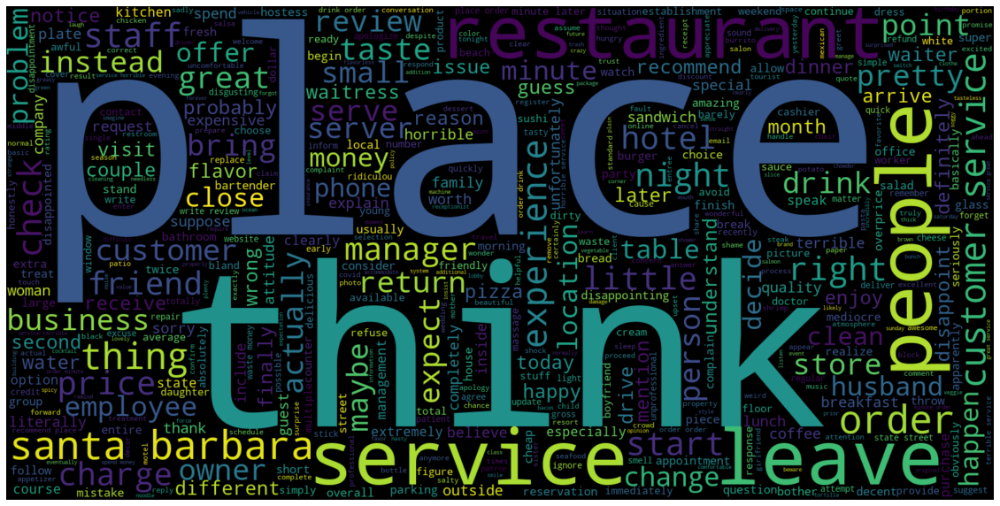

In [42]:
# Display WordCloud associated with rating < 3
plt.figure(figsize = (20,20))
Wc = WordCloud(max_words = 500 , width = 1600 , height = 800,
               min_word_length=5,background_color="black").generate(" ".join(df[df.adjusted_rating < 3].text.apply(lambda x : ' '.join(x))))

plt.axis("off")
plt.imshow(Wc , interpolation = 'bilinear')

Based on the above, some of the keywords associated with low ratings were found to be: 

- Asked
- Customer Service
- Order
- People
- Location

From the wordcloud, the following insights can be drawn about customer preferences:

- Many businesses in the dataset are restaurants, and many reviews on restaurants mention the quality of the food
- Many high ratings were associated with the attitude of staff members (friendly, service, staff).
- Many low ratings appeared to be associated with miscommunications between the customer and business, wrong orders, or unpleasant dialogue with the staff (ordered/asked vs got/came)

### 5.3.3 Datetime Data & Time Series Analysis

In this section, datetime variables are further cleaned and analyzed for  their association with the review ratings. Additional variables are created during this process.

#### Distribution of Start and End Times

Before Analysis, any business that is open 24/7 and all whose start and end times are recorded as '00:00:00' are modified so that the end times are '23:59:59', to correctly reflect the 24 hours of operation.

In [43]:
# Create a list of end time column names
end_times = ['monday_end_time', 'tuesday_end_time', 'wednesday_end_time', 'thursday_end_time', 'friday_end_time', 'saturday_end_time']

# For any dataframe whose hours of operations are all recorded as '00:00:00', change the end times to '23:59:59'
df.loc[df.loc[:,'monday_start_time':'saturday_end_time'].eq('00:00:00').sum(axis = 1) == 12,end_times] = '23:59:59'

The distribution of the start and end times of are reviewed. 

In [44]:
# Select datetime hours
df_times = df.loc[:, 'monday_start_time':"saturday_end_time"]
df_times.head()

,monday_start_time,monday_end_time,tuesday_start_time,tuesday_end_time,wednesday_start_time,wednesday_end_time,thursday_start_time,thursday_end_time,friday_start_time,friday_end_time,saturday_start_time,saturday_end_time
8,10:00:00,19:00:00,11:00:00,21:00:00,11:00:00,21:00:00,11:00:00,21:00:00,11:00:00,20:30:00,11:00:00,21:00:00
9,00:00:00,00:00:00,11:00:00,21:00:00,11:00:00,21:00:00,11:00:00,21:00:00,11:00:00,20:30:00,11:00:00,21:00:00
35,00:00:00,00:00:00,08:00:00,14:00:00,08:00:00,14:00:00,08:00:00,14:00:00,08:00:00,14:00:00,08:00:00,14:00:00
56,09:00:00,17:00:00,09:00:00,17:00:00,09:00:00,17:00:00,09:00:00,17:00:00,09:00:00,17:00:00,10:00:00,15:00:00
61,00:00:00,00:00:00,11:00:00,21:00:00,11:00:00,21:00:00,11:00:00,14:00:00,11:00:00,21:00:00,11:00:00,21:00:00


In [45]:
# Change all columns to datetime
for col in df_times.columns:
    df_times[col] = pd.to_datetime(df_times[col])

In [46]:
# For each datetime column, review the count distributions
num_cols = 2
num_rows = len(df_times.columns) // num_cols + 1 if len(df_times.columns) % num_cols != 0 else len(df_times.columns) // num_cols

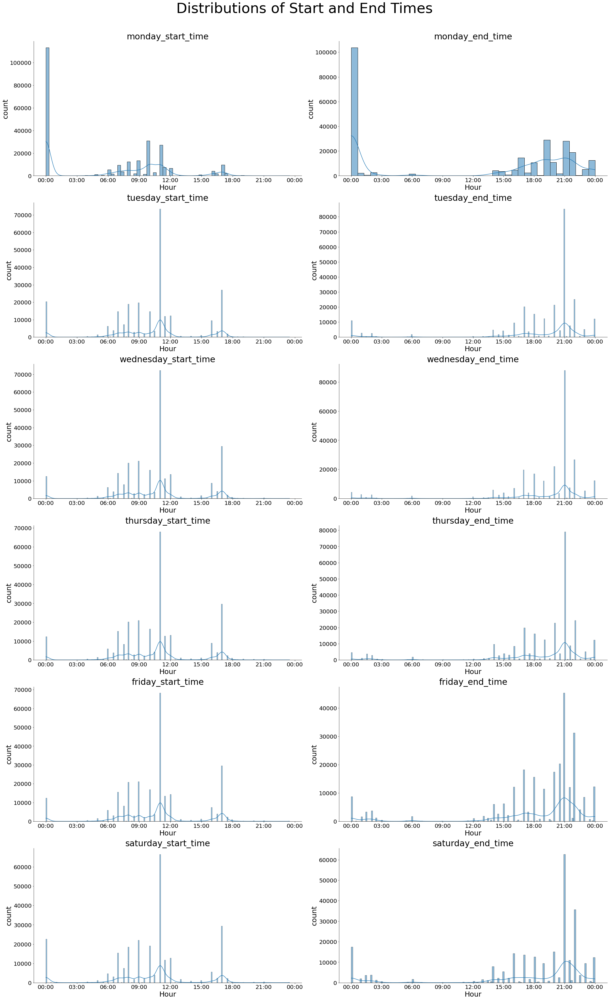

In [47]:
# Import mdates from Matplotlib
import matplotlib.dates as mdates

# Create a formatter to drop the date part of the datetime which is irrelevant
xformatter = mdates.DateFormatter('%H:%M')

# Create Subplots
plt.subplots(nrows = num_rows, ncols = num_cols, figsize = (30,50))

cols = list(df_times.columns)


for i, j in enumerate(cols):
    plt.gcf().axes[i].xaxis.set_major_formatter(xformatter) # Apply formatter created above
    plt.subplot(num_rows, num_cols, i + 1)
    sns.histplot(x = j, data = df_times, kde = True)

    plt.title(j, size = 30)
    plt.yticks(fontsize = 20)
    plt.ylabel('count', fontsize = 25)
    plt.xticks(fontsize = 20)
    plt.xlabel('Hour', fontsize = 25)
    sns.despine()

plt.suptitle('Distributions of Start and End Times\n\n',size = 50)
plt.tight_layout()
plt.show()

From the above, the following observations are made:

- Most businesses open at or around 10:00 - 11:00.
- Most businesses close at or around 21:00 - 22:00.
- Among weekdays, Monday is the most common to be closed.

The datetime objects of the start and end time columns are all converted to numeric values as follows.

In [48]:
# Create a list of column names for hours of operation
cols = list(df_times.columns)

# Convert hours to numeric values
for col in cols:
    df[col] = df_times[col].dt.hour + df_times[col].dt.minute / 60

#### Distribution of Durations of Operation

Durations of operation are calculated based on the hours.

In [49]:
# List of days
days = ['monday','tuesday','wednesday','thursday','friday','saturday']

# Compute durations
for day in days:
    start = day + '_start_time'
    end = day + '_end_time'
    hour = day + '_hour'
    
    # If the end time is larger than the start time, compute the hour by subtracting them
    # If the end time is smaller than the start time, then the end time is from the day after.
    # In that case, add 24 hours to the end time then subtract
    df[hour] = np.where(df[end] > df[start], round(df[end] - df[start]), round(df[end] + 24 - df[start]))

The distribution of the computed durations is reviewed in a histogram.

In [50]:
# Create a dataframe of hours
df_hours = df.loc[:,'monday_hour':'saturday_hour']

In [51]:
# For each datetime column, review the count distributions
num_cols = 2
num_rows = len(df_hours.columns) // num_cols + 1 if len(df_hours.columns) % num_cols != 0 else len(df_hours.columns) // num_cols

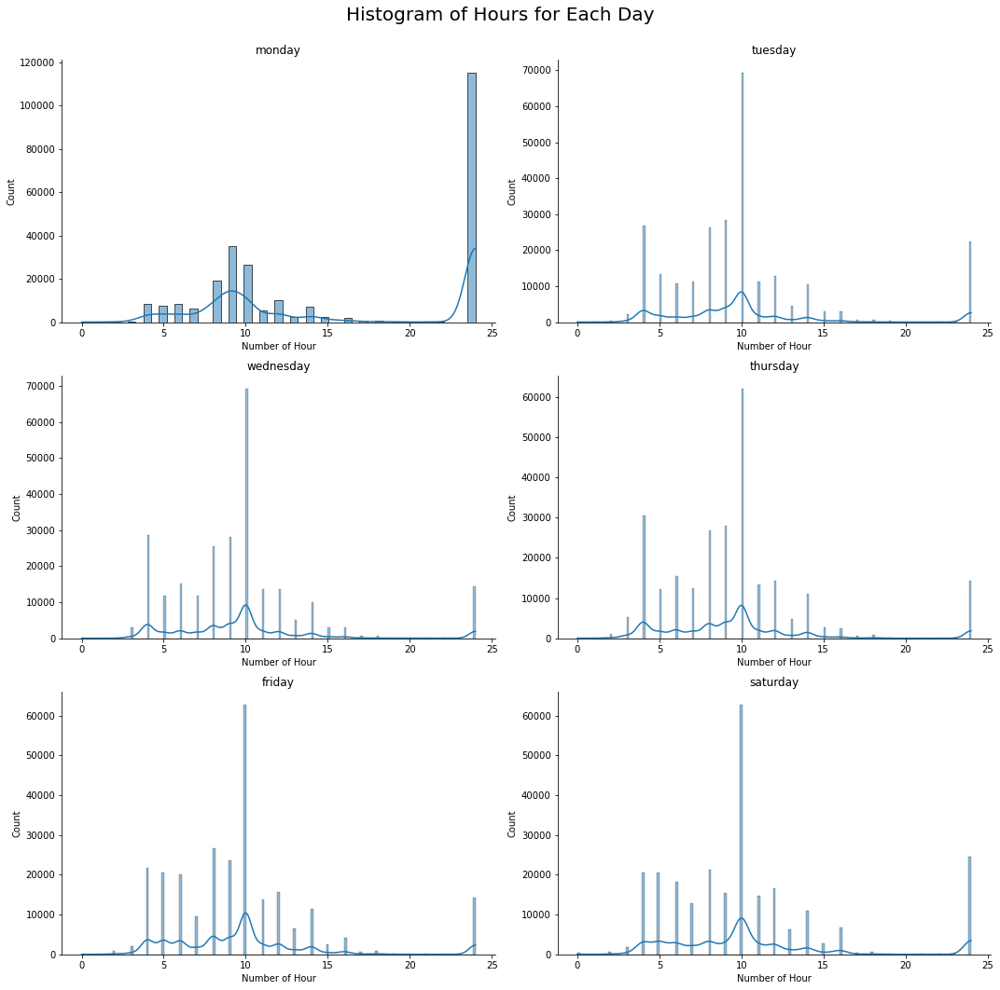

In [52]:
# Create subplots of business operation durations

plt.subplots(num_rows, num_cols, figsize = (15,15))
for i, j in enumerate(df_hours.columns):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.histplot(x = j, data = df, kde = True)
    plt.suptitle('Histogram of Hours for Each Day\n', size = 20)
    plt.title(days[i])
    plt.xlabel('Number of Hour')
    sns.despine()
    
plt.tight_layout()
plt.show()

From the above, the following observations are made:

- The operation duration is approximately normally distributed.
- Most businesses operate for 10 hours a day.

#### Time Series

The variation of mean reviews is observed over time for any trend and/or seasonality.

In [53]:
# Create columns for different intervals
df['year'] = df.date.dt.year
df['month'] = df.date.dt.month
df['day'] = df.date.dt.weekday
df['hour'] = df.date.dt.hour

In [54]:
# Create a new dataframe and set date as the index
df_date = df.set_index('date')

In [55]:
# Create a new dataframe grouped by year-month 
df_date_monthly = df_date.resample("MS").mean()

# Fill NaNs with forward filling method
for i in range(len(df_date_monthly)):
    df_date_monthly = df_date_monthly.ffill()

# Import PlotlyExpress
import plotly.express as px

# Plot Time Series
fig = px.line(df_date_monthly, y="adjusted_rating", title='Mean Rating')
fig.update_layout(width=1000, height=500)

# activate slider
fig.update_xaxes(rangeslider_visible=True)

fig.show()

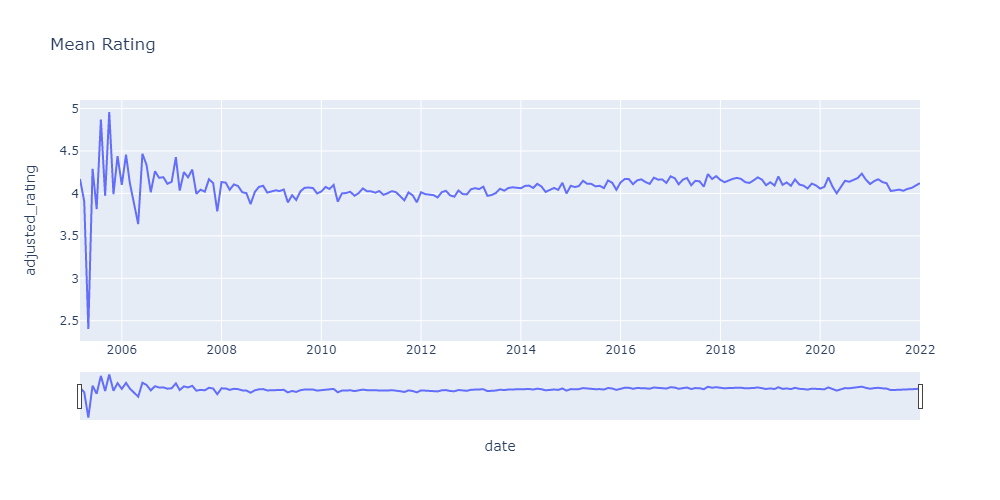

It can be seen that, while the average Yelp rating in Santa Clara in 2005 was very low, and conversely very high in 2006, the mean rating has since converted to 4 aftwerwards.

While no trend or seasonality is apparent, the trend and seasonality are extracted using tsa from Statsmodels API.

In [56]:
# Import additional libraries
from statsmodels.api import tsa # Time-Series Analysis
import plotly.graph_objs as go # Plotly Graph Objects
from plotly.subplots import make_subplots # Plotly Make Subplots

In [57]:
# Decompose the time series
decomposition = tsa.seasonal_decompose(df_date_monthly['adjusted_rating'], model='additive')

In [58]:
# Add the decomposition data
df_date_monthly["Trend"] = decomposition.trend
df_date_monthly["Seasonal"] = decomposition.seasonal
df_date_monthly["Residual"] = decomposition.resid

In [59]:
# Create subplots of trend, seasonal, and residual components
cols = ["Trend", "Seasonal", "Residual"]

fig = make_subplots(rows=3, cols=1, subplot_titles=cols)

for i, col in enumerate(cols):
    fig.add_trace(
        go.Scatter(x=df_date_monthly.index, y=df_date_monthly[col], mode = 'lines'),
        row=i+1,
        col=1
    )

fig.update_layout(height=600, width=800, showlegend=False)
fig.show()

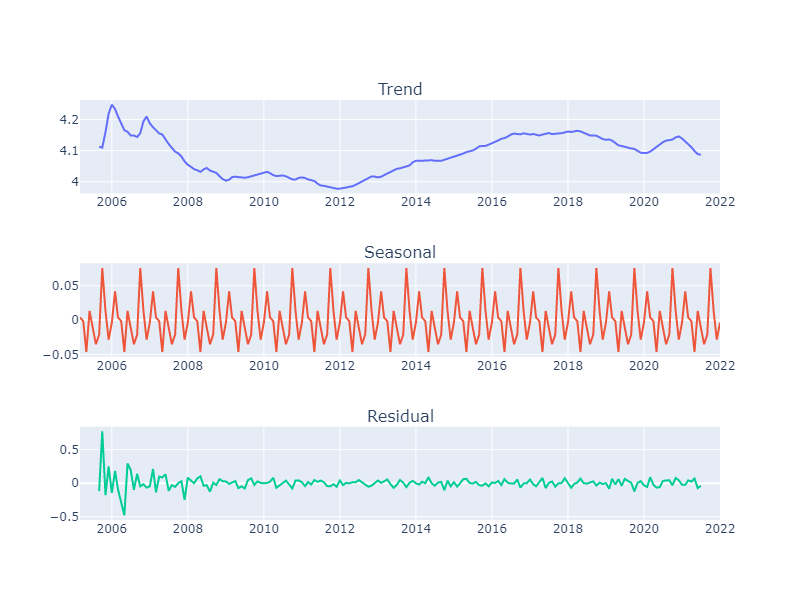

Based on the subplots above, the ratings have constantly decreased from 4.2 to 4 between 2006 and 2012 and since increaed to 4.1. This does not appear to be a great fluctuation considereing the overall scale from 0 to 5.

While the 'Seasonal' subplot does indicate some regular cycles, the amplitude is somewhat small and is not visually reflected in the original time-series plot above.

Therefore, apart from the time preriod between 2006 and 2008, there seems to be no trend or seasonality in the review rating.

Finally, it is reviewed whether the day of the week when a review was written affects the review rating.

In [60]:
# Create Mean Score by Day of Week
mean_score_by_day = df.groupby('day').mean()['adjusted_rating']

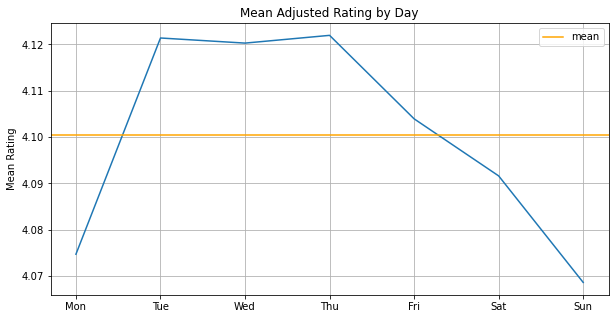

In [61]:
# Plot Mean Score
plt.figure(figsize = (10, 5))
plt.plot(mean_score_by_day.keys(), mean_score_by_day.values)
plt.axhline(mean_score_by_day.mean(), label = 'mean', color = 'orange')
plt.title('Mean Adjusted Rating by Day')
plt.ylabel('Mean Rating')
plt.xticks(mean_score_by_day.keys(), ['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])
plt.legend()
plt.grid()
plt.show()

It appears that, the ratings are typically higher on Thursday and lower on Sundays. To test the statistical significance, One-way ANOVA test is conducted.

The null hypothesis in this case can be that the day of the week when a review is written has no effect on the adjusted rating.

In [62]:
# Import scipy library
from scipy import stats

# Conduct One way ANOVA Test to confirm whether day of week affects rating
stats.f_oneway(df.loc[df['day'] == 0,'adjusted_rating'],\
               df.loc[df['day'] == 1,'adjusted_rating'],\
              df.loc[df['day'] == 2,'adjusted_rating'],\
              df.loc[df['day'] == 3,'adjusted_rating'],\
              df.loc[df['day'] == 4,'adjusted_rating'],\
              df.loc[df['day'] == 5,'adjusted_rating'],\
              df.loc[df['day'] == 6,'adjusted_rating'])

F_onewayResult(statistic=13.845294343770012, pvalue=8.328029192602982e-16)

Based on the ANOVA test results, assuming that the null hypothesis is true, the probability of observing the result (i.e., the p-value) is 8.33e-16. Therefore, the null hypothesis is rejected.

It is likely that customers in Santa Clara tend to rate particularly lower when the review is written on a Monday or Sunday.

Next, the mean adjusted rating by time of the day is reviewed.

The null hypothesis in this case can be that the time of the day when a review is written has no effect on the adjusted rating.

In [63]:
# Create Mean Score by Time of Day
mean_score_by_time = df.groupby('hour').mean()['adjusted_rating']

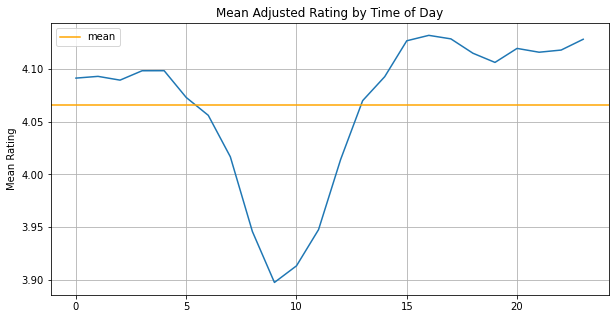

In [64]:
# Plot Mean Score
plt.figure(figsize = (10, 5))
plt.plot(mean_score_by_time.keys(), mean_score_by_time.values)
plt.axhline(mean_score_by_time.mean(), label = 'mean', color = 'orange')
plt.title('Mean Adjusted Rating by Time of Day')
plt.ylabel('Mean Rating')
plt.legend()
plt.grid()
plt.show()

To test the statistical significance of the fluctuation noted, One-way ANOVA test is conducted.

In [65]:
# Conduct One way ANOVA Test to confirm whether time of day affects rating
stats.f_oneway(df.loc[df['hour'] == 0,'adjusted_rating'],\
               df.loc[df['hour'] == 1,'adjusted_rating'],\
              df.loc[df['hour'] == 2,'adjusted_rating'],\
              df.loc[df['hour'] == 3,'adjusted_rating'],\
              df.loc[df['hour'] == 4,'adjusted_rating'],\
              df.loc[df['hour'] == 5,'adjusted_rating'],\
              df.loc[df['hour'] == 6,'adjusted_rating'],\
              df.loc[df['hour'] == 7,'adjusted_rating'],\
              df.loc[df['hour'] == 8,'adjusted_rating'],\
              df.loc[df['hour'] == 9,'adjusted_rating'],\
              df.loc[df['hour'] == 10,'adjusted_rating'],\
              df.loc[df['hour'] == 11,'adjusted_rating'],\
              df.loc[df['hour'] == 12,'adjusted_rating'],\
              df.loc[df['hour'] == 13,'adjusted_rating'],\
              df.loc[df['hour'] == 14,'adjusted_rating'],\
              df.loc[df['hour'] == 15,'adjusted_rating'],\
              df.loc[df['hour'] == 16,'adjusted_rating'],\
              df.loc[df['hour'] == 17,'adjusted_rating'],\
              df.loc[df['hour'] == 18,'adjusted_rating'],\
              df.loc[df['hour'] == 19,'adjusted_rating'],\
              df.loc[df['hour'] == 20,'adjusted_rating'],\
              df.loc[df['hour'] == 21,'adjusted_rating'],\
              df.loc[df['hour'] == 22,'adjusted_rating'],\
              df.loc[df['hour'] == 23,'adjusted_rating'])

F_onewayResult(statistic=10.231481028587757, pvalue=4.223494698378937e-37)

Based on the ANOVA test results, assuming that the null hypothesis is true, the probability of observing the result (i.e., the p-value) is 4.22e-37. Therefore, the null hypothesis is rejected.

It is likely that customers in Santa Clara tend to rate particularly lower when the review is written at 11 a.m.

Although the above analysis result on the relationship between review time and rating can be insightful, the finidngs are not particularly useful for the development of a recommender since the recommender cannot associate a user with any notion of reviewing time when predicting how much the user will like a business.

### 5.3.4 Multi-Variate Relationships

The relationships of the independent variables with the target variable (i.e., the adjusted ratings), as well as those between the independent variables, are reviewed in this section. 

#### Adjusted Rating by Category 

The distributions of adjusted ratings are reviewed for each categorical variable.

In [66]:
# Review Categorical Dataframe
df_categorical.head()

,is_open,alcohol,bikeparking,businessacceptscreditcards,byappointmentonly,caters,goodforkids,hastv,noiselevel,outdoorseating,restaurantsattire,restaurantsdelivery,restaurantsgoodforgroups,restaurantspricerange,restaurantsreservations,restaurantstakeout,wifi,casual,classy,divey,garage,hipster,intimate,lot,romantic,street,touristy,trendy,upscale,valet,validated,active life,american (traditional),automotive,bars,beauty & spas,event planning & services,food,health & medical,home services,local services,nightlife,restaurants,sandwiches,shopping,average_stars,business_rating
8,1,Unknown,True,Unknown,Unknown,Unknown,True,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,2,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,False,Unknown,Unknown,False,Unknown,False,Unknown,Unknown,Unknown,False,False,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4
9,1,beer_and_wine,True,True,Unknown,False,True,False,average,False,casual,True,True,2,False,True,no,True,True,False,False,False,False,False,False,True,Unknown,Unknown,False,False,False,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4,3
35,1,Unknown,True,True,Unknown,True,True,False,average,True,casual,Unknown,True,2,False,True,no,True,False,False,False,True,False,False,False,True,False,True,False,False,False,0,0,0,0,0,0,1,0,0,0,0,1,1,0,4,4
56,1,Unknown,True,True,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,2,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,4
61,1,beer_and_wine,True,True,False,False,True,False,average,True,casual,True,False,2,False,True,no,True,True,False,False,False,False,False,False,False,False,False,False,False,True,0,0,0,1,0,0,1,0,0,0,1,1,0,0,4,4


In [67]:
# For each categorical column, review the count distributions
num_cols = 3
num_rows = len(df_categorical.columns) // num_cols + 1 if len(df_categorical.columns) % num_cols != 0 else len(df_categorical.columns) // num_cols

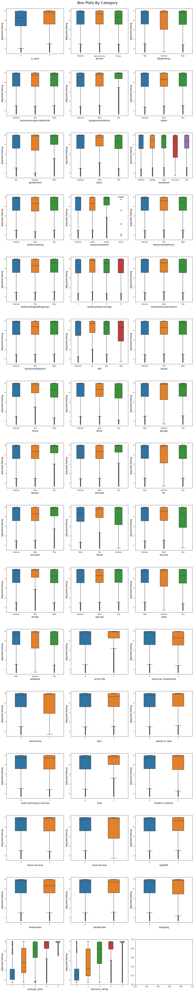

In [68]:
# Create Box Plots by Category
plt.subplots(num_rows, num_cols, figsize = (15, 80))
plt.suptitle('Box Plots By Category', size = 20)
for i, j in enumerate(df_categorical.columns):
    plt.subplot(num_rows,num_cols, i + 1)
    sns.boxplot(x = j, y = 'adjusted_rating', data = df, width = 0.4)
    plt.xlabel(f'{j}\n\n\n', fontsize = 12)
    plt.ylabel('Adjusted Rating', fontsize = 12)
    plt.xticks(fontsize = 8)
    plt.yticks(fontsize = 8)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
# plt.tight_layout()
plt.show()
    

From the above, the following visual observations are made:

- Business rating and average rating are highly related to the ratings given by Yelp users and could be the best indicators of the adjusted rating.
- Businesses that are still running (i.e., not currently out of business) have slightly a higher proportion of higher ratings.
- Businesses that accept custombers by appointment only are associated with higher ratings.
- Businesses whose noise levels are labelled 'very loud' are associated with lower ratings.
- Restaurants that require formal dress code are associated with significantly higher ratings.
- Restaurants of high price range are associated with higher ratings.
- Businesses whose atmosphere is 'hipster' have a higher proportion of higher ratings.
- Businesses that have an intimate atmosphere are associated with higher ratings.
- Businesses that have classic/romantic atmosphere have slightly higher proportion of higher ratings.
- Businesses that are not touristy have a slightly higher portion of higher ratings.
- Business that are classified as 'active life' are associated with higher ratings.
- Automotive-related businesses are associated with lower ratings.
- Beauty & spa-related businesses are associated with higehr ratings.
- Health & medical-related businesses are associated with higehr ratings.
- home-service-related businesses are associated with higehr ratings.
- Businesses that provide services locally are associated with higher ratings.

#### Adjusted Rating for Numerical variable

The distribution of numeric variables and any general trend are reviewed through scatterplot

In [69]:
# Modification of numeric dataframe to include all numeric variables of interest
df_numerical.drop(columns = ['checkin_count', 'yelping_for'], inplace = True)
df_numerical = pd.concat([df_numerical, df.loc[:,'monday_start_time':'saturday_hour']], axis = 1)
df_target = df_numerical.pop('adjusted_rating')
df_numerical['adjusted_rating'] = df_target
df_numerical.head()

,user_review_count,userful_count,funny_count,cool_count,fans,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,friend_count,latitude,longitude,business_review_count,monday_start_time,monday_end_time,tuesday_start_time,tuesday_end_time,wednesday_start_time,wednesday_end_time,thursday_start_time,thursday_end_time,friday_start_time,friday_end_time,saturday_start_time,saturday_end_time,checkin_count,yelping_for,monday_hour,tuesday_hour,wednesday_hour,thursday_hour,friday_hour,saturday_hour,adjusted_rating
8,24,31,8,2,0,0,0,0,0,0,0,0,0,0,0,0,1,34.597239,-119.510772,13,10.0,19.0,11.0,21.0,11.0,21.0,11.0,21.0,11.0,20.5,11.0,21.0,104,155.00,9.0,10.0,10.0,10.0,10.0,10.0,2.888700
9,12,3,1,2,0,0,0,0,0,0,0,0,0,0,0,0,256,34.416984,-119.695556,488,0.0,0.0,11.0,21.0,11.0,21.0,11.0,21.0,11.0,20.5,11.0,21.0,1050,2.30,24.0,10.0,10.0,10.0,10.0,10.0,3.572100
35,17,14,0,5,0,0,0,0,0,0,0,0,0,0,0,0,1,34.414445,-119.690672,389,0.0,0.0,8.0,14.0,8.0,14.0,8.0,14.0,8.0,14.0,8.0,14.0,636,347.80,24.0,6.0,6.0,6.0,6.0,6.0,4.933850
56,38,32,4,9,2,0,0,1,1,0,0,2,0,0,0,0,1,34.414912,-119.694171,13,9.0,17.0,9.0,17.0,9.0,17.0,9.0,17.0,9.0,17.0,10.0,15.0,4,2310.74,8.0,8.0,8.0,8.0,8.0,5.0,4.923425
61,338,800,144,353,30,24,4,0,0,0,9,27,39,39,34,5,115,34.408715,-119.685019,2404,0.0,0.0,11.0,21.0,11.0,21.0,11.0,14.0,11.0,21.0,11.0,21.0,6148,1797.44,24.0,10.0,10.0,3.0,10.0,10.0,4.997675


In [70]:
# For each numerical column, review the count distributions
num_cols = 5
num_rows = len(df_numerical.columns) // num_cols + 1 if len(df_numerical.columns) % num_cols != 0 else len(df_numerical.columns) // num_cols

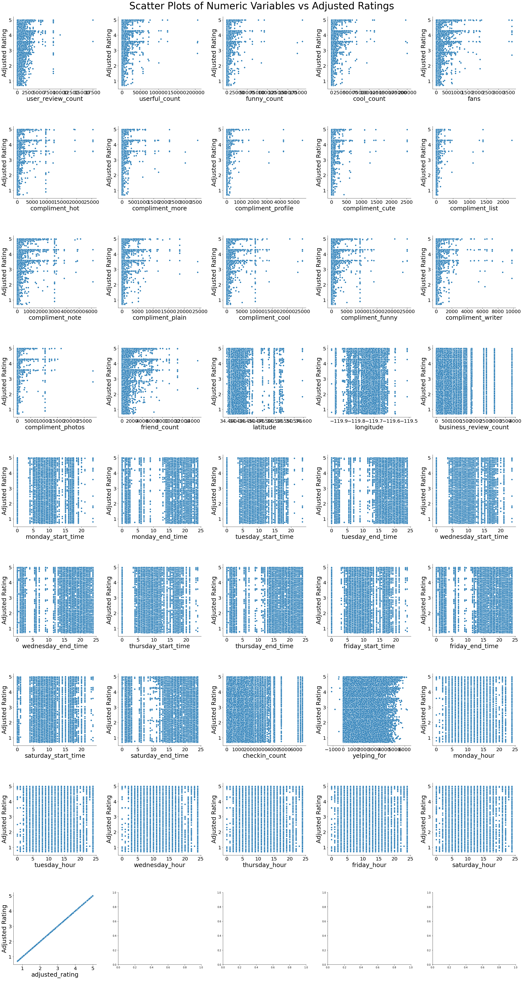

In [71]:
# Create scatterplot

plt.subplots(num_rows, num_cols, figsize = (30, 60))
plt.suptitle('Scatter Plots of Numeric Variables vs Adjusted Ratings', size = 40)
for i, j in enumerate(df_numerical.columns):
    plt.subplot(num_rows,num_cols, i + 1)
    sns.scatterplot(x = j, y = 'adjusted_rating', data = df)
    plt.xlabel(f'{j}\n\n\n', fontsize = 25)
    plt.ylabel('Adjusted Rating', fontsize = 25)
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    sns.despine()
    
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()
    

While there are not many significantly apparent patterns, the adjusted rating appears to be positively correlated with the popularity/activeness of a user.

#### Geographical Distribution

2000 businesses in Santa Clara are sampled from the dataset and are plotted on a map to review any relationship between the location of a business and the rating.

In [72]:
# Import package
import plotly.express as px
import plotly.graph_objects as go

In [115]:
df_map = df.sample(2000)

In [129]:
# px.set_mapbox_access_token(open(".mapbox_token").read())
fig = px.scatter_geo(df_map,
                    lat='latitude',
                    lon='longitude',
                    color = 'adjusted_rating',
                    title = '2000 Businesses in Santa Clara by Adjusted Rating')

# Format map
fig.update_geos(
    visible=False, resolution=110, scope="world",
    showcountries=True, countrycolor="Black",
    showsubunits=True, subunitcolor="Blue",
    showcoastlines=True, coastlinecolor="RebeccaPurple",
    showland=True, landcolor="LightGreen",
    showocean=True, oceancolor="LightBlue",
    showlakes=True, lakecolor="Blue",
    showrivers=True, rivercolor="Blue")

fig.show()

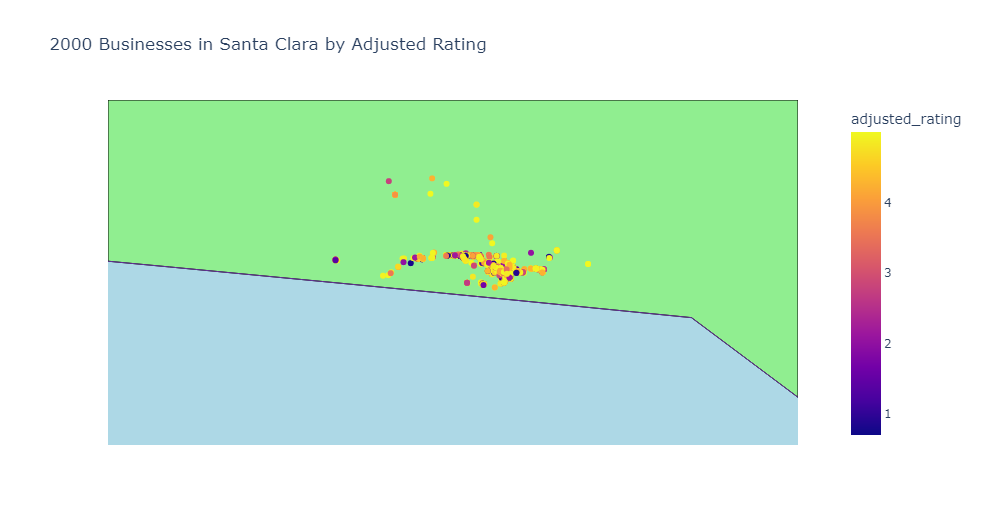

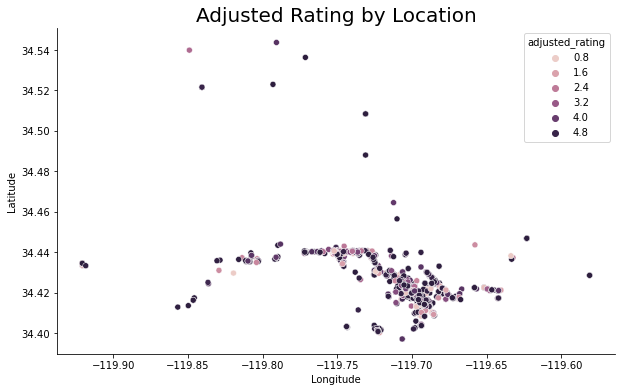

In [128]:
# Plot the above map on a scatter plot
plt.figure(figsize = (10,6))
sns.scatterplot(data = df_map, x = 'longitude', y = 'latitude', hue = df['adjusted_rating'])
plt.title('Adjusted Rating by Location', size = 20)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
sns.despine()
plt.show()

Based on the review, no obvious relationship between the location of a business and its rating is apparent. However, many lowly-rated businesses are noted to be located in the crowded area compared to the outskirts.

#### Correlations - Numeric

The numeric variables of the data frame are reviewed for their correlations with each other and the target variable (i.e. the adjusted_rating column).

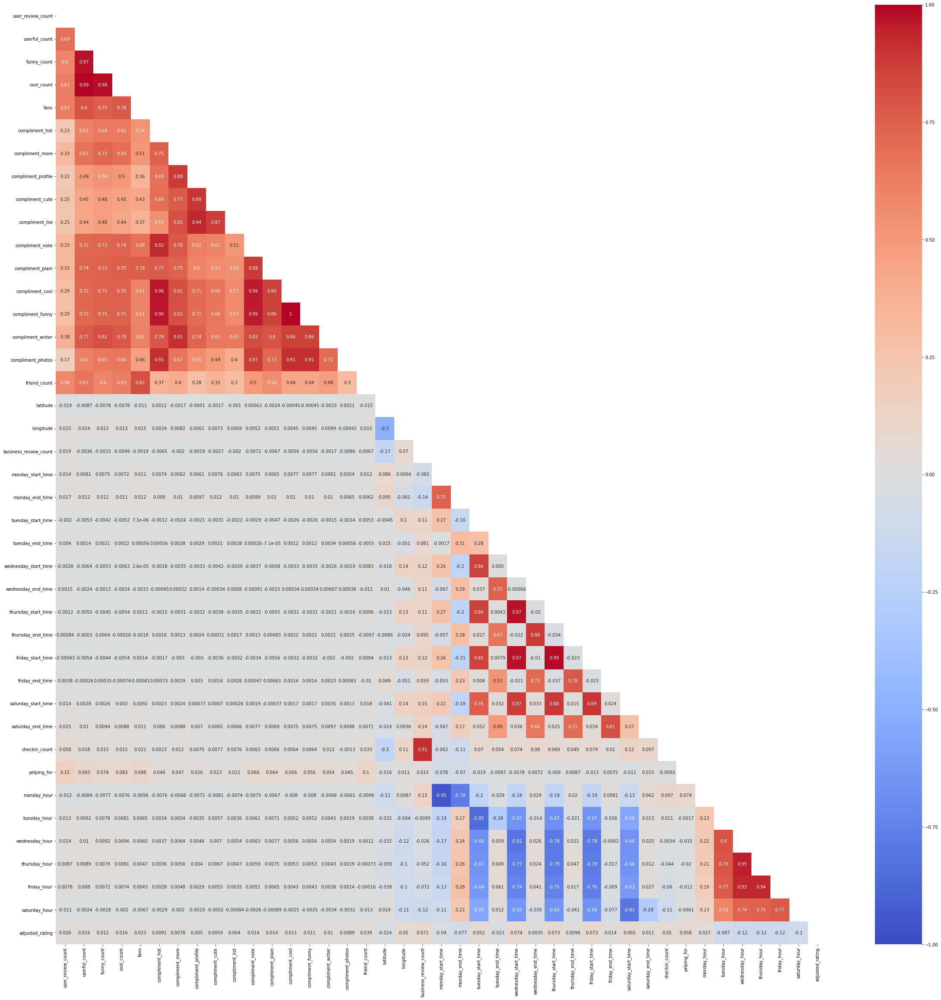

In [75]:
# Plot Correlation Heat Map
plt.figure(figsize = (40, 40))
mask = np.triu(df_numerical.corr()) # Show only bottom half - top half is equivalent
sns.heatmap(df_numerical.corr(), cmap = 'coolwarm', center = 0, vmin = -1, vmax = 1, annot = True, mask = mask)
plt.savefig('download_1.png', facecolor = 'white') # Save image as png w/ white background
plt.show()

While most independent numeric variables are only loosely correlated with the adjusted rating (i.e. the bottom row of correlation table), many collinearities are noted. In the following steps, some of these multicollinear variables are addressed.

Instead of a start time for each day, the mean start time over the six business days is computed.

In [76]:
# Find the overall mean start time
start_list = ['monday_start_time','tuesday_start_time','wednesday_start_time','thursday_start_time','friday_start_time','saturday_start_time']
total_mean_start = round(df[start_list].mean().mean(),2)

In [77]:
# Define a function that finds the row average start time. If all zero, replace with the overall mean
def find_average_start_time(df):
    start_list = ['monday_start_time','tuesday_start_time','wednesday_start_time','thursday_start_time','friday_start_time','saturday_start_time']
    avg_start = []
    for i in start_list:
        if df[i] != 0:
            avg_start.append(df[i])
    return round(sum(avg_start)/len(avg_start),2) if len(avg_start) != 0 else total_mean_start

In [78]:
# Apply function defined above
df['average_start_time'] = df.apply(find_average_start_time, axis = 1)

Instead of an end time for each day, the mean end time over the six business days is computed.

In [79]:
# Find the overall mean end time
end_list = ['monday_end_time','tuesday_end_time','wednesday_end_time','thursday_end_time','friday_end_time','saturday_end_time']
total_mean_end = round(df[end_list].mean().mean(), 2)

In [80]:
# Define a function that finds the row average end time. If all zero, replace with the overall mean
def find_average_end_time(df):
    end_list = ['monday_end_time','tuesday_end_time','wednesday_end_time','thursday_end_time','friday_end_time','saturday_end_time']
    avg_end = []
    for i in end_list:
        if df[i] != 0:
            avg_end.append(df[i])
    return round(sum(avg_end)/len(avg_end),2) if len(avg_end) != 0 else total_mean_end

In [81]:
# Apply function defined above
df['average_end_time'] = df.apply(find_average_end_time, axis = 1)

Instead of a duration of operation for each day, the mean duration over the six business days is computed.

In [82]:
# Find the overall mean duration
duration_list = ['monday_hour','tuesday_hour','wednesday_hour','thursday_hour','friday_hour','saturday_hour']
total_mean_duration = round(df[duration_list].mean().mean(), 2)

In [83]:
# Define a function that finds the row average end time. If all zero, replace with the overall mean
def find_average_duration(df):
    duration_list = ['monday_hour','tuesday_hour','wednesday_hour','thursday_hour','friday_hour','saturday_hour']
    avg_duration = []
    for i in duration_list:
        if df[i] != 0:
            avg_duration.append(df[i])
    return round(sum(avg_duration)/len(avg_duration),2) if len(avg_duration) != 0 else total_mean_duration

In [84]:
# Apply function defined above
df['average_duration'] = df.apply(find_average_duration, axis = 1)

The start times, end times, and durations of the individual days are dropped.

In [85]:
# Drop start times, end times, and durations of individual days
df.drop(columns = start_list, inplace = True)
df.drop(columns = end_list, inplace = True)
df.drop(columns = duration_list, inplace = True)

In [86]:
# Drop start times, end times, and durations of individual days
df_numerical.drop(columns = start_list, inplace = True)
df_numerical.drop(columns = end_list, inplace = True)
df_numerical.drop(columns = duration_list, inplace = True)

Then, the average start, end, and duration columns are added along with the review year, month, and day.

In [87]:
# Add year, month, day, and average start/end/duration columns
df_numerical = pd.concat([df_numerical, df.loc[:,'year':]], axis = 1)

Some discrete variables such as `average_stars`, `business_rating`, and `restaurantspricerange` are moved to the numeric dataframe since they are ordinal.

In [88]:
# Move 'average_stars' and 'business_rating columns' from categorical to numerical
df_numerical[['average_stars', 'business_rating', 'restaurantspricerange']] = df_categorical[['average_stars', 'business_rating', 'restaurantspricerange']]

In [89]:
# Drop 'average_stars' and 'business_rating columns' from categorical
df_categorical.drop(columns = ['average_stars', 'business_rating', 'restaurantspricerange'], inplace = True)

In [90]:
# Move adjusted_rating to the end
ar = df_numerical.pop('adjusted_rating')
df_numerical['adjusted_rating'] = ar

After the cleanup, the correlation heatmap is one again reviewed.

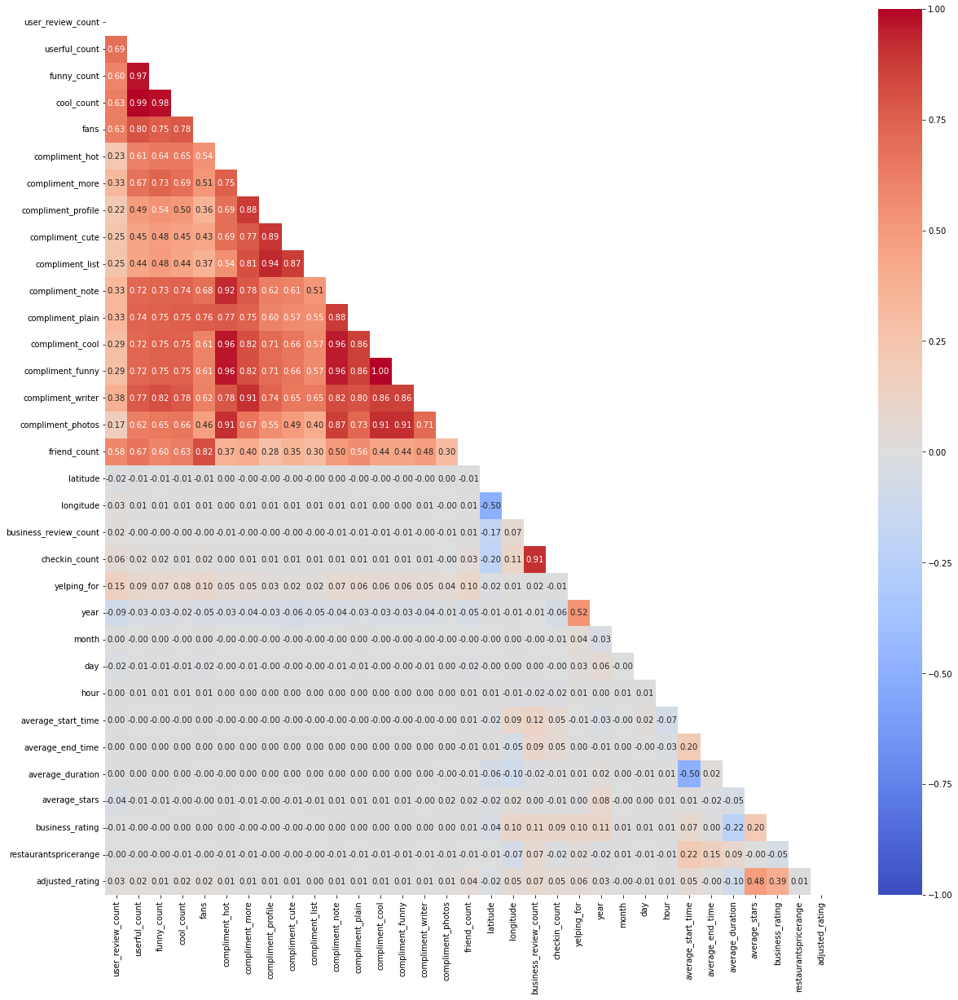

In [91]:
# sns heatmap
plt.figure(figsize = (20, 20))
mask = np.triu(df_numerical.corr())
sns.heatmap(df_numerical.corr(), cmap = 'coolwarm', center = 0, vmin = -1, vmax = 1, annot = True, mask = mask, fmt = '.2f')
plt.savefig('download_2.png', facecolor = 'white')
plt.show()

It can be seen that the multicollinearities between the business hours have been reduced. It can be also seen that the averge stars given by users and business ratings are most highly correlated with the `adjusted_rating`.

#### Correlations - Categorical

As with the numeric variables, the categorical variables are also reviewed for their correlations with the adjusted rating and multi-collinearity. Before plotting the heatmap, certain categorical columns are one-hot encoded to contain numeric values.

First, the columns that need to be one-hot encoded are identified.

In [94]:
# Columns to one-hot encode
cols_to_dummy= list(df_categorical.loc[:,'alcohol':'validated'].columns)

Some of the categorical columns have True or False values while others have other options. For the True-or-False columns, an Unknown value is assumed to be False. This is based on the assumption that the value is unknown because it is not collected, which in turn is because the value under a certain categorical variable is false.

In [95]:
cols_to_ohe = []

for col in cols_to_dummy:
    if 'True' in df_categorical[col].unique():
        df_categorical[col] = df_categorical[col].map({'True' : 1, 'False' : 0, 'Unknown' : 0})
    else:
        cols_to_ohe.append(col)

In [96]:
# One-hot encode categorical variables
df_categorical = pd.get_dummies(data = df_categorical, prefix = cols_to_ohe, columns = cols_to_ohe)

In [97]:
# Add adjusted rating column to the end for correlation reveiw
df_categorical['adjusted_rating'] = df['adjusted_rating']

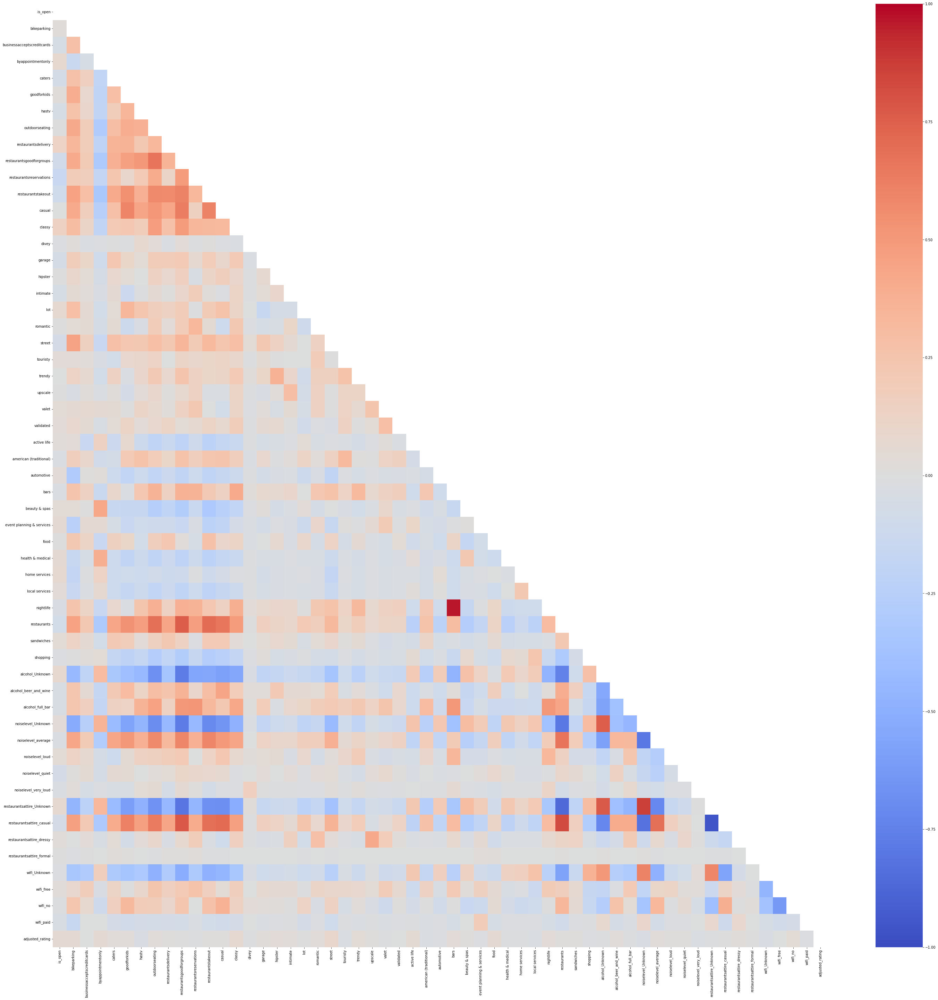

In [98]:
# sns heatmap
plt.figure(figsize = (50, 50))
mask = np.triu(df_categorical.corr())
sns.heatmap(df_categorical.corr(), cmap = 'coolwarm', center = 0, vmin = -1, vmax = 1, mask = mask)
plt.savefig('download_4.png', facecolor = 'white')
plt.show()

All categorical independent variables are rather loosely related to the adjusted rating of the review. It is visible that multicollinearities are present among some of the independent variables.

Generally, the low correlation between independent variables and the target for both the numeric and categorical variables indicate that there is no linear correlation between the independent and dependent variables such that a higher/lower value of a feature guarantees a high rating (aside from average stars and business rating). In other words, the personal preference of every user may play an important factor in predicting the adjusted rating and properly accounting for it will be important.

### 5.3.5 Final Dataframe to Model

The final dataframe to be modelled is created by combining the one-hot-encoded categorical dataframe with the numeric dataframe.

In [99]:
# Combine categorical and numeric dataframes

# Remove adjusted rating from categorical dataframe
df_categorical.drop(columns = 'adjusted_rating', inplace = True)

In [100]:
# Combine categorical and numeric dataframes
df_final = pd.concat([df.iloc[:,:3], df_categorical, df_numerical], axis = 1)

In [101]:
# Review df_final
df_final.head()

,review_id,user_id,business_id,is_open,bikeparking,businessacceptscreditcards,byappointmentonly,caters,goodforkids,hastv,outdoorseating,restaurantsdelivery,restaurantsgoodforgroups,restaurantsreservations,restaurantstakeout,casual,classy,divey,garage,hipster,intimate,lot,romantic,street,touristy,trendy,upscale,valet,validated,active life,american (traditional),automotive,bars,beauty & spas,event planning & services,food,health & medical,home services,local services,nightlife,restaurants,sandwiches,shopping,alcohol_Unknown,alcohol_beer_and_wine,alcohol_full_bar,noiselevel_Unknown,noiselevel_average,noiselevel_loud,noiselevel_quiet,noiselevel_very_loud,restaurantsattire_Unknown,restaurantsattire_casual,restaurantsattire_dressy,restaurantsattire_formal,wifi_Unknown,wifi_free,wifi_no,wifi_paid,user_review_count,userful_count,funny_count,cool_count,fans,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,friend_count,latitude,longitude,business_review_count,checkin_count,yelping_for,year,month,day,hour,average_start_time,average_end_time,average_duration,average_stars,business_rating,restaurantspricerange,adjusted_rating
8,ZKvDG2sBvHVdF5oBNUOpAQ,wSTuiTk-sKNdcFyprzZAjg,B5XSoSG3SfvQGtKEGQ1tSQ,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,24,31,8,2,0,0,0,0,0,0,0,0,0,0,0,0,1,34.597239,-119.510772,13,104,155.00,2016,3,2,22,10.83,20.58,9.83,1,4,2,2.888700
9,pUycOfUwM8vqX7KjRRhUEA,59MxRhNVhU9MYndMkz0wtw,gebiRewfieSdtt17PTW6Zg,1,1,1,0,0,1,0,0,1,1,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,12,3,1,2,0,0,0,0,0,0,0,0,0,0,0,0,256,34.416984,-119.695556,488,1050,2.30,2016,7,0,7,11.00,20.90,12.33,4,3,2,3.572100
35,L0jv8c2FbpWSlfNC6bbUEA,bFPdtzu11Oi0f92EAcjqmg,IDtLPgUrqorrpqSLdfMhZQ,1,1,1,0,1,1,0,1,0,1,0,1,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,17,14,0,5,0,0,0,0,0,0,0,0,0,0,0,0,1,34.414445,-119.690672,389,636,347.80,2016,10,3,22,8.00,14.00,9.00,4,4,2,4.933850
56,2u5Skti5mZam_-XTKPelvA,IMd3NQbclta91pFKk3AJZg,qO9dNNIvNbCBd8ZgjxMxgQ,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,38,32,4,9,2,0,0,1,1,0,0,2,0,0,0,0,1,34.414912,-119.694171,13,4,2310.74,2017,4,5,0,9.17,16.67,7.50,3,4,2,4.923425
61,4zopEEPqfwm-c_FNpeHZYw,JYYYKt6TdVA4ng9lLcXt_g,SZU9c8V2GuREDN5KgyHFJw,1,1,1,0,0,1,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,338,800,144,353,30,24,4,0,0,0,9,27,39,39,34,5,115,34.408715,-119.685019,2404,6148,1797.44,2016,5,1,2,11.00,19.60,11.17,4,4,2,4.997675


As mentioned earlier, the recommender should not account for the time of a review. Therefore, such information is removed from the final data.

In [119]:
# Final Data
df_final = df_final.drop(columns = ['year', 'month', 'day', 'hour'])

In [103]:
# Rearranging certain columns such that the front portion of the columns are business-related and the remainder are user-related

# Columns to move
cols_to_move = ['latitude','longitude','business_rating','restaurantspricerange','checkin_count', 'average_duration', 'average_end_time', 'average_start_time', 'business_review_count']

# Move columns
for col in cols_to_move:
    new_col = df_final.pop(col)
    df_final.insert(3, column = col, value = new_col)

In [104]:
# Move adjusted_rating column to the end
ar = df_final.pop('adjusted_rating')
df_final['adjusted_rating'] = ar

In [105]:
# Final Dataframe
df_final.head()

,review_id,user_id,business_id,business_review_count,average_start_time,average_end_time,average_duration,checkin_count,restaurantspricerange,business_rating,longitude,latitude,is_open,bikeparking,businessacceptscreditcards,byappointmentonly,caters,goodforkids,hastv,outdoorseating,restaurantsdelivery,restaurantsgoodforgroups,restaurantsreservations,restaurantstakeout,casual,classy,divey,garage,hipster,intimate,lot,romantic,street,touristy,trendy,upscale,valet,validated,active life,american (traditional),automotive,bars,beauty & spas,event planning & services,food,health & medical,home services,local services,nightlife,restaurants,sandwiches,shopping,alcohol_Unknown,alcohol_beer_and_wine,alcohol_full_bar,noiselevel_Unknown,noiselevel_average,noiselevel_loud,noiselevel_quiet,noiselevel_very_loud,restaurantsattire_Unknown,restaurantsattire_casual,restaurantsattire_dressy,restaurantsattire_formal,wifi_Unknown,wifi_free,wifi_no,wifi_paid,user_review_count,userful_count,funny_count,cool_count,fans,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,friend_count,yelping_for,average_stars,adjusted_rating
8,ZKvDG2sBvHVdF5oBNUOpAQ,wSTuiTk-sKNdcFyprzZAjg,B5XSoSG3SfvQGtKEGQ1tSQ,13,10.83,20.58,9.83,104,2,4,-119.510772,34.597239,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,24,31,8,2,0,0,0,0,0,0,0,0,0,0,0,0,1,155.00,1,2.888700
9,pUycOfUwM8vqX7KjRRhUEA,59MxRhNVhU9MYndMkz0wtw,gebiRewfieSdtt17PTW6Zg,488,11.00,20.90,12.33,1050,2,3,-119.695556,34.416984,1,1,1,0,0,1,0,0,1,1,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,12,3,1,2,0,0,0,0,0,0,0,0,0,0,0,0,256,2.30,4,3.572100
35,L0jv8c2FbpWSlfNC6bbUEA,bFPdtzu11Oi0f92EAcjqmg,IDtLPgUrqorrpqSLdfMhZQ,389,8.00,14.00,9.00,636,2,4,-119.690672,34.414445,1,1,1,0,1,1,0,1,0,1,0,1,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,17,14,0,5,0,0,0,0,0,0,0,0,0,0,0,0,1,347.80,4,4.933850
56,2u5Skti5mZam_-XTKPelvA,IMd3NQbclta91pFKk3AJZg,qO9dNNIvNbCBd8ZgjxMxgQ,13,9.17,16.67,7.50,4,2,4,-119.694171,34.414912,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,38,32,4,9,2,0,0,1,1,0,0,2,0,0,0,0,1,2310.74,3,4.923425
61,4zopEEPqfwm-c_FNpeHZYw,JYYYKt6TdVA4ng9lLcXt_g,SZU9c8V2GuREDN5KgyHFJw,2404,11.00,19.60,11.17,6148,2,4,-119.685019,34.408715,1,1,1,0,0,1,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,338,800,144,353,30,24,4,0,0,0,9,27,39,39,34,5,115,1797.44,4,4.997675


In [106]:
# Review df_final's shape
df_final.shape

(258756, 88)

In [107]:
# save as csv
df_final.to_csv('yelp_for_model.csv')